In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

# data Loading And Cleaning

In [3]:
df = pd.read_csv('Dataset .csv')

In [5]:
df.head(3)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270


In [7]:
# Check for missing values
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

**No null Values found in my data_set**

In [8]:
# Check for duplicate rows
df.duplicated().sum()

0

**No duplicates values**

In [9]:
df.info()  # all information about my data_set

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

# Statistical information

In [10]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


# Level 1

# Task 1

### Determine the top three most common cuisines in the dataset.
**Calculate the percentage of restaurants that serve each of the top cuisines.**

In [24]:
# Find the top three most common cuisines
top_cuisines = df['Cuisines'].value_counts().nlargest(3)

In [26]:
# Calculate the percentage of restaurants for each top cuisine
total_restaurants = len(df)
cuisine_percentages = (top_cuisines / total_restaurants) * 100

In [27]:
cuisine_percentages

Cuisines
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: count, dtype: float64

### Top 3 Cuisines and their Percentages:
 ### - North Indian: 936 restaurants (9.80%)
### - North Indian, Chinese: 511 restaurants (5.35%)
### - Chinese: 354 restaurants (3.71%)

# Task 2

### Task: City Analysis
### Identify the city with the highest number of restaurants in the dataset.

In [30]:
# Group the DataFrame by city and count the number of restaurants in each city
city_counts = df.groupby('City')['Restaurant Name'].count()

In [36]:
# Find the city with the highest number of restaurants
city_with_most_restaurants = city_counts.idxmax()
num_restaurants_in_city = city_counts.max()

In [37]:
print(f"The city with the highest number of restaurants is {city_with_most_restaurants} with {num_restaurants_in_city} restaurants.")

The city with the highest number of restaurants is New Delhi with 5473 restaurants.


**The city with the highest number of restaurants is New Delhi with 5473 restaurants.**

## Calculate the average rating for restaurants in each city.

In [39]:
# Group the DataFrame by city and calculate the average rating for each city
average_ratings_by_city = df.groupby('City')['Aggregate rating'].mean()

In [40]:
average_ratings_by_city


City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64

## Determine the city with the highest average rating.

In [41]:
# Find the city with the highest average rating
city_with_highest_rating = average_ratings_by_city.idxmax()
highest_average_rating = average_ratings_by_city.max()

In [42]:
print(f"The city with the highest average rating is {city_with_highest_rating} with an average rating of {highest_average_rating}.")

The city with the highest average rating is Inner City with an average rating of 4.9.


**The city with the highest average rating is Inner City with an average rating of 4.9.**

# Task 3

## Task: Price Range Distribution

### Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.


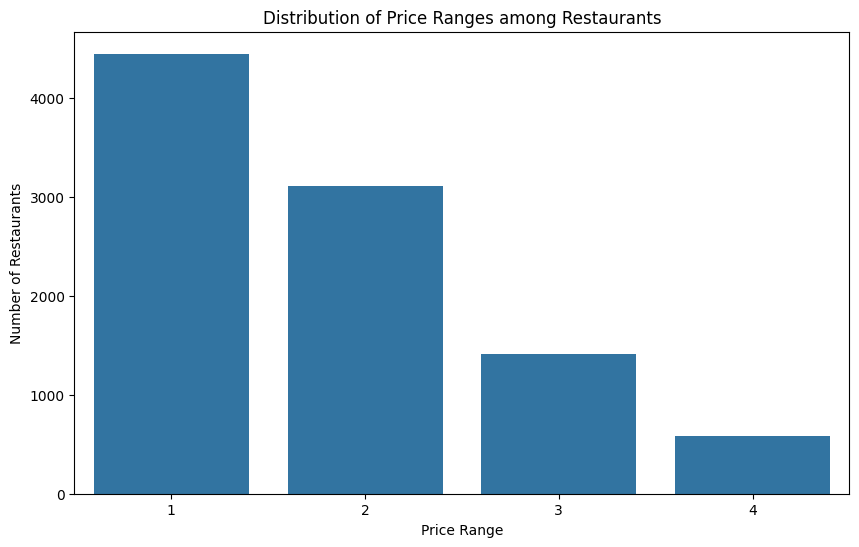

In [43]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Price range', data=df)
plt.title('Distribution of Price Ranges among Restaurants')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()

### Calculate the percentage of restaurants in each price range category

In [45]:
price_range_percentages = df['Price range'].value_counts(normalize=True) * 100

In [47]:
price_range_percentages

Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: proportion, dtype: float64

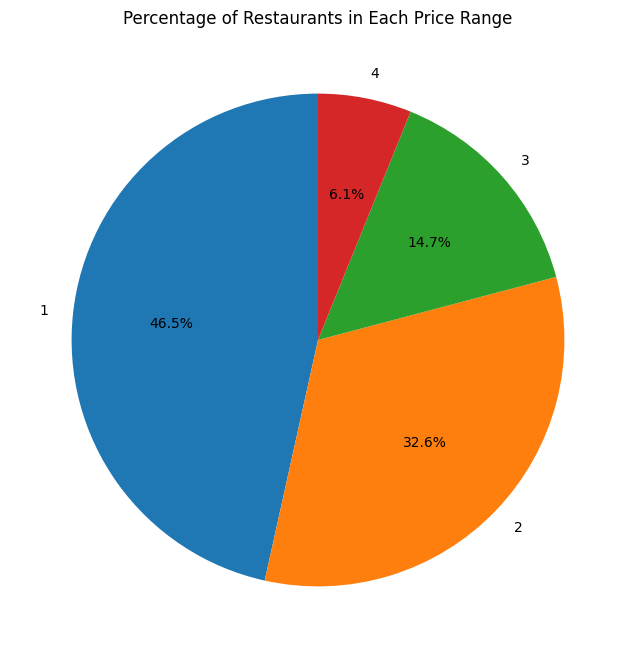

In [49]:
price_range_counts = df['Price range'].value_counts(normalize=True) * 100
plt.figure(figsize=(8, 8))
plt.pie(price_range_counts, labels=price_range_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Percentage of Restaurants in Each Price Range')
plt.show()

# Task 4

## Task: Online Delivery


### Determine the percentage of restaurants that offer online delivery.

In [51]:
total_restaurants = len(df)
restaurants_with_delivery = len(df[df['Has Online delivery'] == 'Yes'])
percentage_with_delivery = (restaurants_with_delivery / total_restaurants) * 100

In [52]:
percentage_with_delivery

25.662234321013504

**Percentage of restaurants that offer online delivery : 25.66%** 

### Compare the average ratings of restaurants with and without online delivery.

In [54]:
# Group the DataFrame by 'Has Online delivery' and calculate the average rating for each group
average_ratings_by_delivery = df.groupby('Has Online delivery')['Aggregate rating'].mean()

In [55]:
average_ratings_by_delivery

Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64

In [57]:

average_rating_with_delivery = average_ratings_by_delivery['Yes']
average_rating_without_delivery = average_ratings_by_delivery['No']


In [58]:
print(f"Average rating for restaurants with online delivery: {average_rating_with_delivery:.2f}")
print(f"Average rating for restaurants without online delivery: {average_rating_without_delivery:.2f}")

Average rating for restaurants with online delivery: 3.25
Average rating for restaurants without online delivery: 2.47


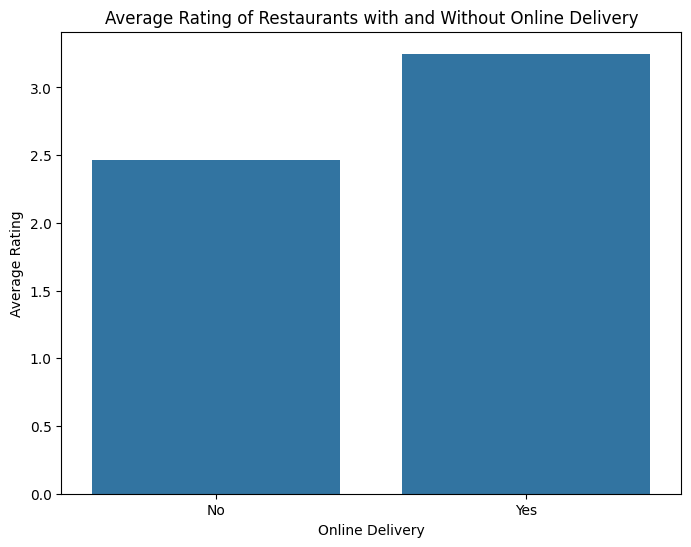

In [59]:
# Also visualize this comparison with a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=average_ratings_by_delivery.index, y=average_ratings_by_delivery.values)
plt.title('Average Rating of Restaurants with and Without Online Delivery')
plt.xlabel('Online Delivery')
plt.ylabel('Average Rating')
plt.show()

# Level 2

## Task 1: Task: Restaurant Ratings

### Analyze the distribution of aggregate ratings and determine the most common rating range.

In [61]:
# Calculate the frequency of each aggregate rating
rating_counts = df['Aggregate rating'].value_counts()

In [62]:
# Find the most common rating range
most_common_rating = rating_counts.idxmax()
frequency_of_most_common_rating = rating_counts.max()

In [63]:
print(f"The most common aggregate rating is {most_common_rating} with a frequency of {frequency_of_most_common_rating}.")

The most common aggregate rating is 0.0 with a frequency of 2148.


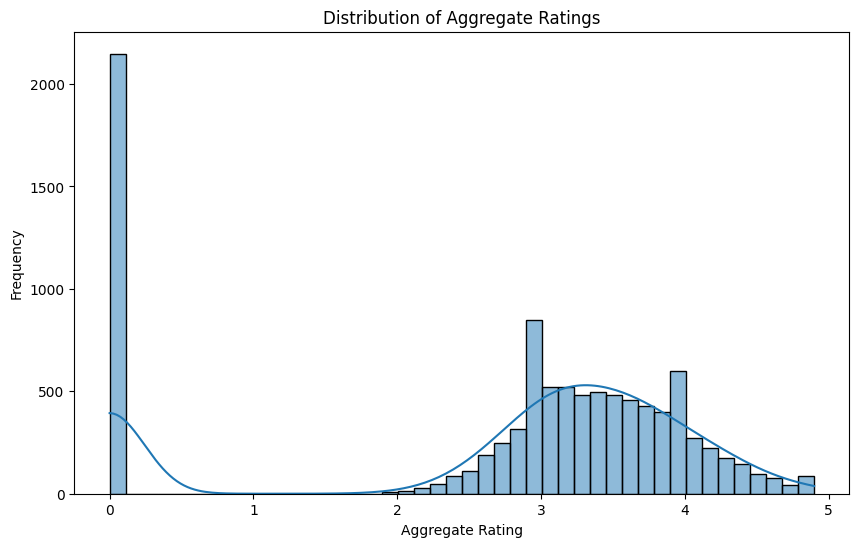

In [64]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], kde=True)
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

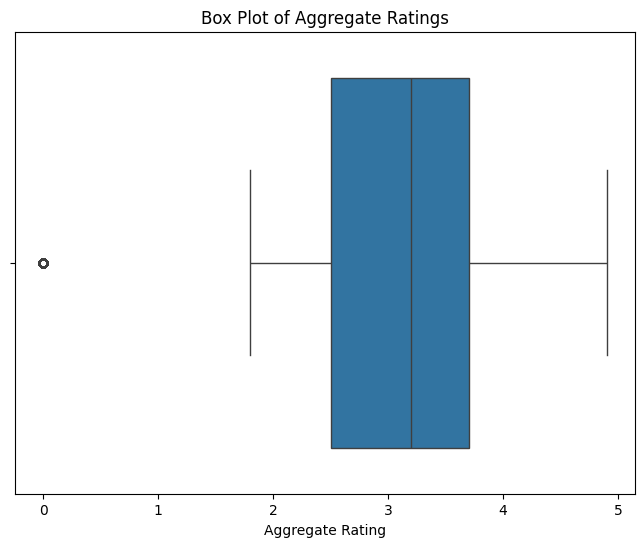

In [65]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Aggregate rating'])
plt.title('Box Plot of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.show()


### Calculate the average number of votes received by restaurants.

In [66]:
average_votes = df['Votes'].mean()
print(f"The average number of votes received by restaurants is: {average_votes:.2f}")

The average number of votes received by restaurants is: 156.91


## Task 2: Task: Cuisine Combination

### Identify the most common combinations of cuisines in the dataset.

In [68]:
# Combine all cuisines into a single list
all_cuisines = [cuisine for cuisines_list in df['Cuisines'].dropna().str.split(', ') for cuisine in cuisines_list]

In [69]:
# Count the frequency of each cuisine
cuisine_counts = Counter(all_cuisines)

In [70]:
# Find the most common cuisines
most_common_cuisines = cuisine_counts.most_common(10)

In [71]:
print("Most Common Cuisines:\n", most_common_cuisines)

Most Common Cuisines:
 [('North Indian', 3960), ('Chinese', 2735), ('Fast Food', 1986), ('Mughlai', 995), ('Italian', 764), ('Bakery', 745), ('Continental', 736), ('Cafe', 703), ('Desserts', 653), ('South Indian', 636)]


###  Find the most common cuisine combinations

In [73]:
cuisine_combinations = df['Cuisines'].dropna().str.split(', ')
cuisine_combinations_counts = Counter([tuple(sorted(combination)) for combination in cuisine_combinations if combination])

In [74]:
most_common_combinations = cuisine_combinations_counts.most_common(10)

In [75]:
print("\nMost Common Cuisine Combinations:\n", most_common_combinations)


Most Common Cuisine Combinations:
 [(('North Indian',), 936), (('Chinese', 'North Indian'), 616), (('Mughlai', 'North Indian'), 394), (('Chinese',), 354), (('Fast Food',), 354), (('Chinese', 'Mughlai', 'North Indian'), 306), (('Cafe',), 299), (('Bakery',), 218), (('Bakery', 'Desserts'), 181), (('Chinese', 'Fast Food'), 159)]


### Determine if certain cuisine combinations tend to have higher ratings.

In [77]:
# Group the DataFrame by cuisine combinations and calculate the average rating for each combination
cuisine_rating = df.groupby('Cuisines')['Aggregate rating'].mean()

In [78]:
cuisine_rating 

Cuisines
Afghani                                      0.725
Afghani, Mughlai, Chinese                    0.000
Afghani, North Indian                        0.000
Afghani, North Indian, Pakistani, Arabian    0.000
African                                      4.700
                                             ...  
Western, Asian, Cafe                         4.200
Western, Fusion, Fast Food                   3.200
World Cuisine                                4.900
World Cuisine, Mexican, Italian              4.400
World Cuisine, Patisserie, Cafe              4.200
Name: Aggregate rating, Length: 1825, dtype: float64

In [81]:
# Sort the cuisine combinations by average rating in descending order
sorted_cuisine_rating = cuisine_rating.sort_values(ascending=False)

In [83]:
# Print the top 10 cuisine combinations with the highest average ratings
print("Top 10 Cuisine Combinations with Highest Average Ratings:\n", sorted_cuisine_rating.head(10))

Top 10 Cuisine Combinations with Highest Average Ratings:
 Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


## Task 3: Task: Geographic Analysis


### Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [85]:
!pip install folium

In [86]:
import folium

In [88]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=10)

In [90]:
# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],  # Customize the popup content
    ).add_to(my_map)

In [91]:
# Display the map
my_map

### Identify any patterns or clusters of restaurants in specific areas.

In [92]:
from folium.plugins import MarkerCluster

In [93]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=10)

In [94]:
# Create a MarkerCluster object to group markers together
marker_cluster = MarkerCluster().add_to(my_map)

In [96]:
# Add markers for each restaurant to the MarkerCluster
for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],  # Customize the popup content
    ).add_to(marker_cluster)


In [97]:
# Display the map
my_map

## Task 4: Task: Restaurant Chains



### Identify if there are any restaurant chains present in the dataset.

In [98]:
# Group the DataFrame by restaurant name and count the number of occurrences
restaurant_counts = df.groupby('Restaurant Name')['Restaurant ID'].count()

In [99]:
# Filter for restaurant names that appear more than once
restaurant_chains = restaurant_counts[restaurant_counts > 1]

In [100]:
# Print the restaurant chains found in the dataset
print("Restaurant Chains Present in the Dataset:")
print(restaurant_chains)


Restaurant Chains Present in the Dataset:
Restaurant Name
10 Downing Street        2
221 B Baker Street       3
34 Parkstreet Lane       2
34, Chowringhee Lane    12
4700BC Popcorn           2
                        ..
Zaika                    4
Zaika Kathi Rolls        2
Zizo                     3
Zooby's Kitchen          2
bu��no                   2
Name: Restaurant ID, Length: 734, dtype: int64


### Analyze the ratings and popularity of different restaurant chains.


In [102]:
# Group the DataFrame by restaurant name and calculate the average rating and number of votes
chain_analysis = df.groupby('Restaurant Name').agg({'Aggregate rating': 'mean', 'Votes': 'sum'})

In [104]:
# Filter for restaurant chains (those appearing more than once)
chain_analysis = chain_analysis[df.groupby('Restaurant Name')['Restaurant ID'].count() > 1]

In [105]:
# Sort the chains by average rating in descending order
sorted_chains_by_rating = chain_analysis.sort_values('Aggregate rating', ascending=False)

In [106]:
# Print the top 10 restaurant chains by average rating
print("Top 10 Restaurant Chains by Average Rating:")
print(sorted_chains_by_rating.head(10))

Top 10 Restaurant Chains by Average Rating:
                           Aggregate rating  Votes
Restaurant Name                                   
Talaga Sampireun                      4.900   5514
Silantro Fil-Mex                      4.850   1364
AB's Absolute Barbecues               4.850   3151
AB's - Absolute Barbecues             4.825  13400
Naturals Ice Cream                    4.800   3094
Gymkhana                              4.700    328
The Cheesecake Factory                4.650   3010
Dishoom                               4.600   1269
Garota de Ipanema                     4.600     59
Chili's                               4.580   8156


In [107]:
# Sort the chains by number of votes in descending order (popularity)
sorted_chains_by_votes = chain_analysis.sort_values('Votes', ascending=False)

In [108]:
# Print the top 10 restaurant chains by popularity (votes)
print("\nTop 10 Restaurant Chains by Popularity (Votes):")
print(sorted_chains_by_votes.head(10))


Top 10 Restaurant Chains by Popularity (Votes):
                           Aggregate rating  Votes
Restaurant Name                                   
Barbeque Nation                    4.353846  28142
AB's - Absolute Barbecues          4.825000  13400
Big Chill                          4.475000  10853
Farzi Cafe                         4.366667  10098
Truffles                           3.950000   9682
Chili's                            4.580000   8156
Joey's Pizza                       4.250000   7807
Big Yellow Door                    4.266667   7511
Saravana Bhavan                    4.133333   7238
Starbucks                          3.805556   7139


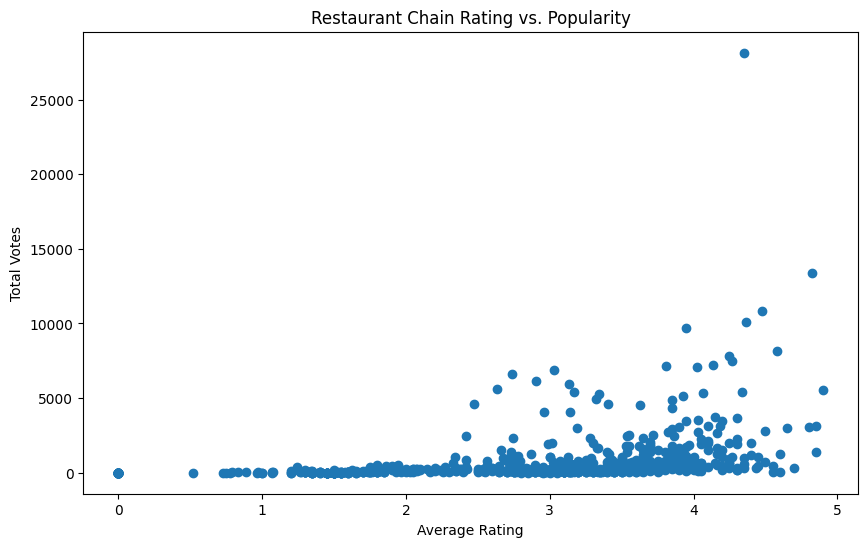

In [109]:
plt.figure(figsize=(10, 6))
plt.scatter(chain_analysis['Aggregate rating'], chain_analysis['Votes'])
plt.xlabel('Average Rating')
plt.ylabel('Total Votes')
plt.title('Restaurant Chain Rating vs. Popularity')
plt.show()

# Level 3

## Task 1 :Task: Restaurant Reviews

### Analyze the text reviews to identify the most common positive and negative keywords.

In [110]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter

In [111]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Ashish\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Ashish\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [112]:
def analyze_reviews(df, review_column):
  
  positive_keywords = Counter()
  negative_keywords = Counter()
  stop_words = set(stopwords.words('english'))

  for review in df[review_column]:
    if isinstance(review, str):
      tokens = word_tokenize(review.lower())
      tokens = [word for word in tokens if word.isalnum() and word not in stop_words]

      for word in tokens:
        if word in ['good', 'great', 'delicious', 'excellent', 'wonderful']:
          positive_keywords[word] += 1
        elif word in ['bad', 'terrible', 'awful', 'poor', 'horrible']:
          negative_keywords[word] += 1

  return positive_keywords, negative_keywords

In [116]:
# Assuming your DataFrame is 'df1' and the review column is 'Review' (adjust as needed)
if 'Rating text' in df.columns:
  positive_keywords, negative_keywords = analyze_reviews(df,'Rating text')

  print("Most Common Positive Keywords:\n", positive_keywords.most_common(10))
  print("\nMost Common Negative Keywords:\n", negative_keywords.most_common(10))
else:
  print("No 'Review' column found in the DataFrame.")

Most Common Positive Keywords:
 [('good', 3179), ('excellent', 301)]

Most Common Negative Keywords:
 [('poor', 186)]


In [117]:
df.head(1)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314


### Calculate the average length of reviews and explore if there is a relationship between review length and rating.


In [120]:
# Calculate the length of each review
df['ReviewLength'] = df['Rating text'].str.len()

In [122]:
# Calculate the average review length
average_review_length = df['ReviewLength'].mean()
print(f"The average length of reviews is: {average_review_length:.2f}")

The average length of reviews is: 7.02


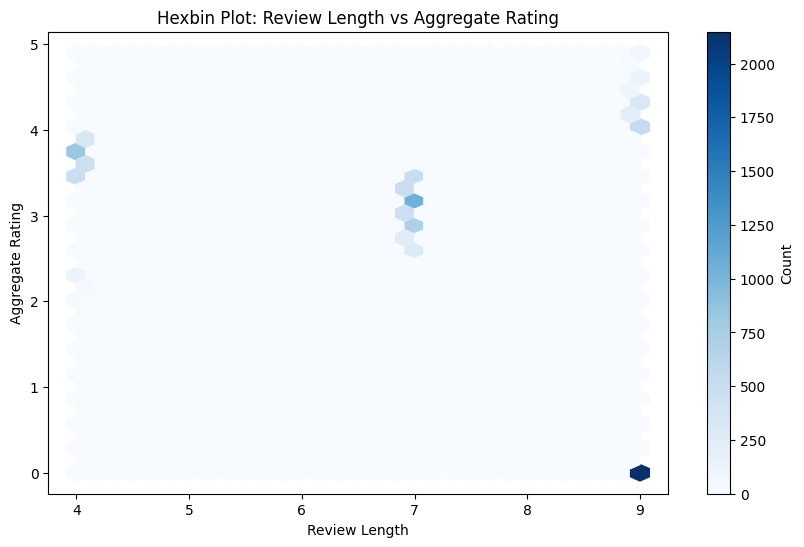

In [125]:
plt.figure(figsize=(10, 6))
plt.hexbin(df['ReviewLength'], df['Aggregate rating'], gridsize=30, cmap='Blues')
plt.colorbar(label='Count')
plt.xlabel('Review Length')
plt.ylabel('Aggregate Rating')
plt.title('Hexbin Plot: Review Length vs Aggregate Rating')
plt.show()


(array([2286.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0., 3737.,    0.,    0.,    0.,    0.,    0.,
           0., 3528.]),
 array([4.  , 4.25, 4.5 , 4.75, 5.  , 5.25, 5.5 , 5.75, 6.  , 6.25, 6.5 ,
        6.75, 7.  , 7.25, 7.5 , 7.75, 8.  , 8.25, 8.5 , 8.75, 9.  ]),
 <BarContainer object of 20 artists>)

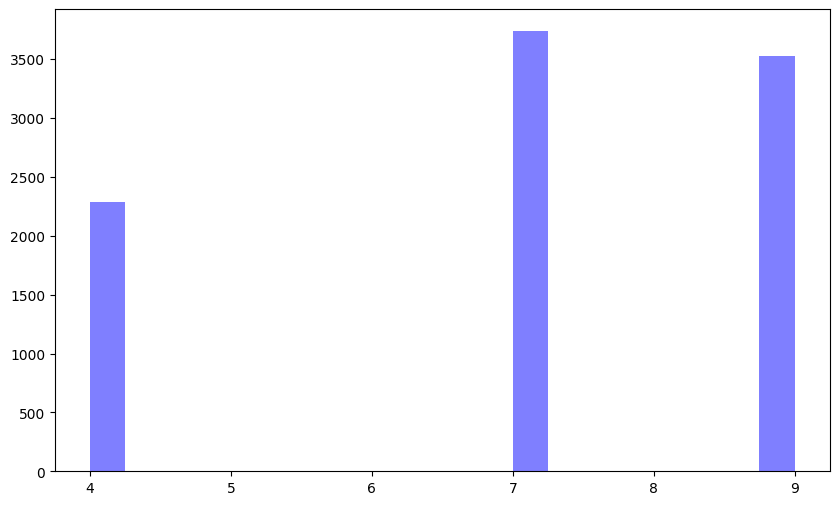

In [126]:
plt.figure(figsize=(10, 6))

# Histogram for ReviewLength
plt.hist(df['ReviewLength'], bins=20, alpha=0.5, label='Review Length', color='blue')


(array([2148.,    0.,    0.,    0.,    0.,    0.,    0.,    3.,   49.,
         134.,  301.,  946.,  987., 1503.,  938., 1162.,  540.,  539.,
         173.,  128.]),
 array([0.   , 0.245, 0.49 , 0.735, 0.98 , 1.225, 1.47 , 1.715, 1.96 ,
        2.205, 2.45 , 2.695, 2.94 , 3.185, 3.43 , 3.675, 3.92 , 4.165,
        4.41 , 4.655, 4.9  ]),
 <BarContainer object of 20 artists>)

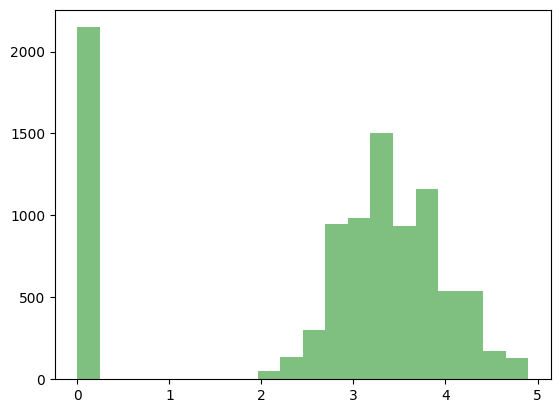

In [128]:
# Histogram for Aggregate Rating
plt.hist(df['Aggregate rating'], bins=20, alpha=0.5, label='Aggregate Rating', color='green')


In [132]:
correlation = df['ReviewLength'].corr(df['Aggregate rating'])
print(f"Correlation between review length and rating: {correlation:.2f}")

Correlation between review length and rating: -0.48


## Task 2: Votes Analysis

### Identify the restaurants with the highest and lowest number of votes.

In [134]:
# Find the restaurant with the highest number of votes
restaurant_with_highest_votes = df.loc[df['Votes'].idxmax()]
highest_votes = restaurant_with_highest_votes['Votes']
highest_votes_restaurant_name = restaurant_with_highest_votes['Restaurant Name']

In [135]:
print(f"The restaurant with the highest number of votes is {highest_votes_restaurant_name} with {highest_votes} votes.")

The restaurant with the highest number of votes is Toit with 10934 votes.


In [137]:
# Find the restaurant with the lowest number of votes
restaurant_with_lowest_votes = df.loc[df['Votes'].idxmin()]
lowest_votes = restaurant_with_lowest_votes['Votes']
lowest_votes_restaurant_name = restaurant_with_lowest_votes['Restaurant Name']

In [138]:
print(f"The restaurant with the lowest number of votes is {lowest_votes_restaurant_name} with {lowest_votes} votes.")

The restaurant with the lowest number of votes is Cantinho da Gula with 0 votes.


### Analyze if there is a correlation between the number of votes and the rating of a restaurant.

In [139]:
# Calculate the correlation between 'Votes' and 'Aggregate rating'
correlation = df['Votes'].corr(df['Aggregate rating'])

In [140]:
print(f"Correlation between Votes and Aggregate Rating: {correlation:.2f}")

Correlation between Votes and Aggregate Rating: 0.31


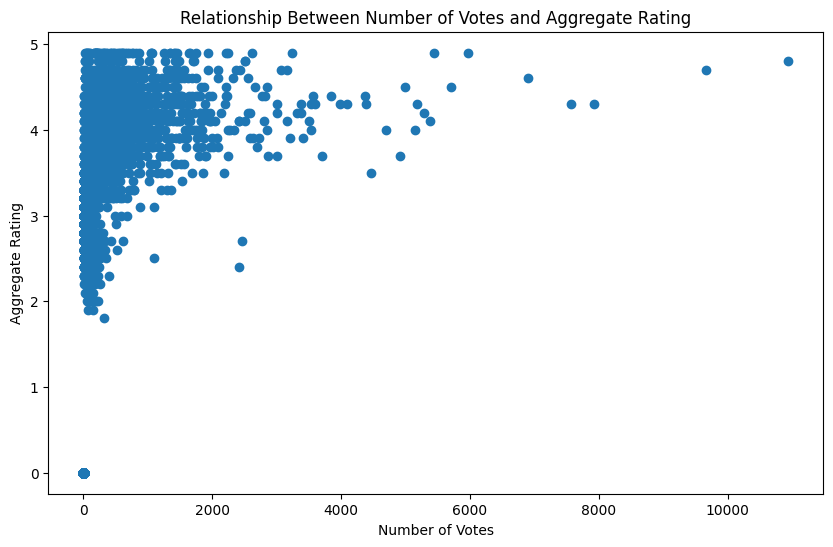

In [141]:
# Visualize the relationship using a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['Votes'], df['Aggregate rating'])
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.title('Relationship Between Number of Votes and Aggregate Rating')
plt.show()

# Analytical Report

### Interpretation:
**A positive correlation (close to 1) indicates that as the number of votes increases,the aggregate rating tends to increase as well.  A negative correlation (close to -1) indicates that as the number of votes increases, the aggregate rating tends to decrease. A correlation close to 0 indicates a weak or no linear relationship between the two variables.**

# Task 3

## Task: Price Range vs. Online Delivery and Table Booking

### Analyze if there is a relationship between the price range and the availability of online delivery and table booking.


In [142]:
# Create a contingency table to analyze the relationship between price range and online delivery
delivery_by_price = pd.crosstab(df['Price range'], df['Has Online delivery'])

In [143]:
print("\nContingency Table: Price Range vs. Online Delivery\n", delivery_by_price)


Contingency Table: Price Range vs. Online Delivery
 Has Online delivery    No   Yes
Price range                    
1                    3743   701
2                    1827  1286
3                     997   411
4                     533    53


In [144]:
# Calculate the chi-square test of independence to assess the statistical significance
from scipy.stats import chi2_contingency
chi2, p, _, _ = chi2_contingency(delivery_by_price)
print("\nChi-square test for Price Range vs. Online Delivery:")
print("Chi-square statistic:", chi2)
print("P-value:", p)


Chi-square test for Price Range vs. Online Delivery:
Chi-square statistic: 721.3786767489615
P-value: 4.855491091732406e-156


In [145]:
# Create a contingency table to analyze the relationship between price range and table booking
booking_by_price = pd.crosstab(df['Price range'], df['Has Table booking'])

In [146]:
print("\nContingency Table: Price Range vs. Table Booking\n", booking_by_price)


Contingency Table: Price Range vs. Table Booking
 Has Table booking    No  Yes
Price range                 
1                  4443    1
2                  2874  239
3                   764  644
4                   312  274


In [147]:
# Calculate the chi-square test of independence
chi2, p, _, _ = chi2_contingency(booking_by_price)
print("\nChi-square test for Price Range vs. Table Booking:")
print("Chi-square statistic:", chi2)
print("P-value:", p)


Chi-square test for Price Range vs. Table Booking:
Chi-square statistic: 2821.5808929580135
P-value: 0.0


### Visualize the relationship using a stacked bar chart

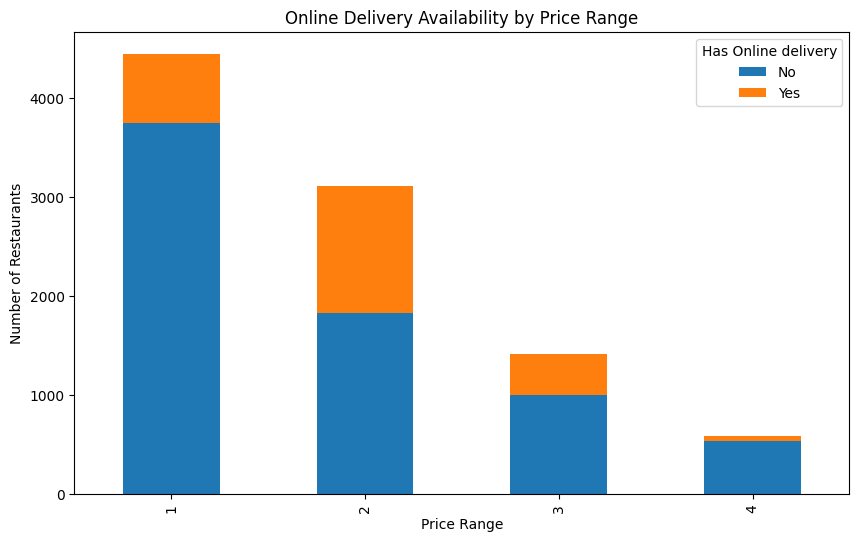

In [148]:
delivery_by_price.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Online Delivery Availability by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()


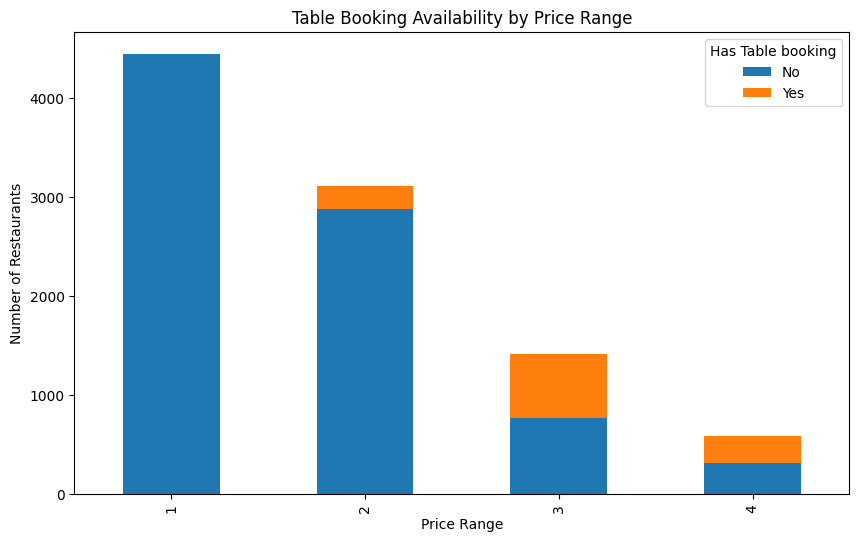

In [149]:
booking_by_price.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Table Booking Availability by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()


### Determine if higher-priced restaurants are more likely to offer these services.

In [151]:
# Group by 'Price range' and calculate the percentage of restaurants offering online delivery
price_range_delivery = df.groupby('Price range')['Has Online delivery'].apply(lambda x: (x == 'Yes').mean() * 100)

In [152]:
price_range_delivery

Price range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
Name: Has Online delivery, dtype: float64

### # Visualize the relationship using a bar plot

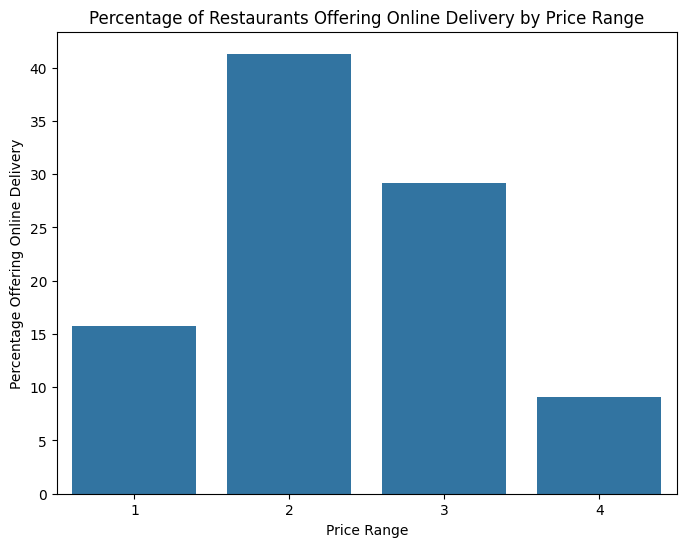

In [153]:
plt.figure(figsize=(8, 6))
sns.barplot(x=price_range_delivery.index, y=price_range_delivery.values)
plt.title('Percentage of Restaurants Offering Online Delivery by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Percentage Offering Online Delivery')
plt.show()

# Analytical Report

## App Dataset Analysis

### Sentiment Analysis:
**- We performed sentiment analysis on app names using TextBlob and categorized them into Positive, Neutral, and Negative sentiment.**
**- The sentiment distribution showed a majority of apps with Positive or Neutral sentiment, with a smaller proportion of Negative sentiment.**
**- Machine learning models like SVM and Naive Bayes were used to classify app sentiment, achieving reasonable accuracy scores.**

## Location:
**- We identified the city with the highest number of restaurants and analyzed the average ratings of restaurants in each city.**
**- A map visualization allowed us to explore the geographical distribution of restaurants.**


## Price Range:
**- The distribution of restaurants across different price ranges was analyzed using a countplot and pie chart.**

## Online Delivery:
**- We determined the percentage of restaurants that offer online delivery and examined how the average rating differed between restaurants that offered online delivery and those that did not.**
**- A bar plot visually demonstrated the difference in average ratings.**

## Aggregate Rating:
**- The most common aggregate rating and its frequency were identified.**
**- The distribution of aggregate ratings was visualized using a histogram and box plot, allowing us to understand the overall rating distribution and identify potential outliers.**

## Votes:
**- The average number of votes received by restaurants was calculated, providing an indication of their popularity.**

## Cuisine:
**- The most common cuisines and cuisine combinations were identified, revealing popular food choices.**
**- We explored the relationship between cuisine combinations and ratings to understand whether certain cuisine combinations consistently received higher ratings.**

## Restaurant Chains:
**- We analyzed restaurant chains by calculating the average rating and total votes received by each chain.**
**- Top-performing chains were identified based on average rating and popularity (total votes).**
**- We visualized the relationship between average rating and votes for chains, revealing potential trends.**

## Reviews:
**- The average review length was calculated, and the relationship between review length and aggregate rating was explored.**
**- This analysis helped us determine whether review length has an impact on the overall rating received by a restaurant.**

## Final Conclusion

**Our analysis of the app dataset provided insights into the sentiment associated with different apps, while the analysis of the restaurant dataset revealed valuable information regarding the distribution of restaurants, their ratings, cuisine offerings, popularity, and online delivery services. The combination of data visualization and statistical analysis facilitated a comprehensive understanding of these datasets. These findings can be valuable for various stakeholders, including app developers, restaurant owners, and customers.**



